<a href="https://colab.research.google.com/github/jsrobson/2023-cis5450-termproject/blob/main/CIS5450_TermProject_04_map_data_COMPLETE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Notebook: Cartographic data visualization
*Description:* Given the inherent spatial nature of the project datasets, we use this notebook as a means to visualize data using cartographic datasets and the [contextly](https://contextily.readthedocs.io/en/latest/) and [geopandas](https://geopandas.org/en/stable/) Python libraries.

This notebook contains code to visualize data using cartographic datasets and map-based Python libraries.

*Data:* We will use the following datasets to build cartographic data visualizations:
* condensed STR listings (86,359 rows; sourced from [Inside Airbnb](http://insideairbnb.com/explore/))
* attribute-linked property price paid and environmental performance (57,719 rows; sourced from [University College London / UK Data Service](https://reshare.ukdataservice.ac.uk/854942/))
* CSV of London boroughs categorized by binary `inner/outer` position.
* 2011 borough boundary shapefile for Greater London [(GLA, 2019)](https://data.london.gov.uk/dataset/statistical-gis-boundary-files-london)

*Return:* This notebook produces several cartographic visualizations using the specified datasets. These visualizations are:

* Frequency of STR in inner London Boroughs, 2019-2020
* Average value (GBP) by floor area of properties by borough, 2019-2020
* Average local council taxation rate (GBP) by borough, 2019-2020
* Average level of deprivation (income) by borough, English Indices of Deprivation 2019
* Average level of deprivation (employment) by borough, English Indices of Deprivation 2019
* Average level of deprivation (crime) by borough, English Indices of Deprivation 2019
* Average level of deprivation (health) by borough, English Indices of Deprivation 2019
* Average level of deprivation (housing) by borough, English Indices of Deprivation 2019
* Average level of deprivation (environment) by borough, English Indices of Deprivation 2019

# 1. File initialization
In this section, we import libraries, initialize filepaths, and reuse predefined dataloader functions from [Load Data](https://colab.research.google.com/drive/1MXdBZLM5Yw3anvdrP-qozn7MHs_6SzDw?usp=sharing) notebook.

In [ ]:
# run install for needed packages
!pip install geopandas
!pip install contextily

In [ ]:
# mount Google Drive data
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# import necessary libraries
from dask import dataframe as dd
import contextily as cx
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 2. Load and clean data
*Description:* In this section, we load and clean the necessary datasets. We reuse predefined dataloaders from the [Load Data](https://colab.research.google.com/drive/1MXdBZLM5Yw3anvdrP-qozn7MHs_6SzDw?usp=sharing) notebook. First, we instantiate the necessary filepaths and helper functions. Then, we perform the necessary steps to load and clean each specified dataset as above.

*Return*: The workflow in this section produces a dataframe `df_boroughs`, which includes the following features:

```
borough: Name of the inner London borough
count_list: Count of STR listings by borough
price_sq_m: Average price per square metre of property by borough
avg_tax: Average tax across all bands by borough
income-avgrank: Average rank of index of deprivation, domain: income, English ID
employ-avgrank: Average rank of index of deprivation, domain: employment, English ID
crime-avgrank: Average rank of index of deprivation, domain: crime, English ID
health-avgrank: Average rank of index of deprivation, domain: health, English ID
housing-avgrank: Average rank of index of deprivation, domain: housing, English ID
environment-avgrank: Average rank of index of deprivation, domain: environment, English ID
```

In [ ]:
# filepaths for data
b_path = "/content/drive/MyDrive/CIS5450/Term_Project/data/ldn_borough/ldn_borough.csv"
id_path = "/content/drive/MyDrive/CIS5450/Term_Project/data/ldn_borough/ldn_id2019.csv"
lt_path = "/content/drive/MyDrive/CIS5450/Term_Project/data/ldn_airbnb/listings_cond.csv"
pr_path = "/content/drive/MyDrive/CIS5450/Term_Project/data/uk_property/uk_epdc_prop.csv"
sf_path = "/content/drive/MyDrive/CIS5450/Term_Project/data/shapefile/London_Borough_Excluding_MHW.shp"
tax_path = "/content/drive/MyDrive/CIS5450/Term_Project/data/ldn_borough/ldn_counciltax2019.csv"

In [ ]:
# helper function to get boroughs as list
def read_boroughs_to_list(filepath):
    # read file
    file_in = pd.read_csv(filepath, dtype={"neighbourhood": "str"})
    # filter by inner boroughs
    file_in = file_in[file_in['location'] == 'inner']
    # return boroughs as list
    return file_in['neighbourhood'].values.tolist()

In [ ]:
# helper function to read listings to dataframe
def read_listings_to_df(filepath):
    # assign dtypes to each column
    d_listing = {
        "id": "int32",
        "name": "string",
        "host_id": "int32",
        "host_name": "string",
        "neighbourhood_group": "string",
        "neighbourhood": "string",
        "latitude": "float",
        "longitude": "float",
        "room_type": "string",
        "price": "float",
        "minimum_nights": "int32",
        "number_of_reviews": "int32",
        "last_review": "string",
        "reviews_per_month": "float",
        "calculated_host_listings_count": "int32",
        "availability_365": "int32",
    }
    # read csv using dtype dict
    file_in = pd.read_csv(filepath, dtype=d_listing)
    return parse_listings_df(file_in)


def parse_listings_df(dataframe):
    # rename column for common alignment
    dataframe.rename(inplace=True, columns={'neighbourhood': 'borough'})
    # convert last_review as date/time
    dataframe['last_review'] = pd.to_datetime(dataframe['last_review'],format='%Y-%m-%d')
    # build array of columns to drop
    to_drop = ['name', 'host_name', 'neighbourhood_group']
    # drop specified columns from listings
    dataframe.drop(axis=1, columns=to_drop, inplace=True)
    return dataframe

In [ ]:
# helper function to read property data to df
def read_epdc_prop_to_df(filepath):
    # use dask for multiprocessor csv reading support
    file_in = dd.read_csv(filepath, dtype="string")
    # return a pandas df using parsing helper method
    return parse_epdc_prop_df(file_in)

def parse_epdc_prop_df(df):
    # define cols to cast to int
    cols_int = ['id', 'price', 'year', 'numberrooms',
                'BUILDING_REFERENCE_NUMBER']
    # define cols to drop (mostly redundant, unneeded, or artefact)
    to_drop = ['Unnamed: 0', 'towncity', 'county', 'lad11nm', 'rgn11nm',
               'LOCAL_AUTHORITY_LABEL', 'CONSTITUENCY_LABEL']
    # convert dask df to pandas df
    pd_df = df.compute()
    # drop specified cols from df
    pd_df.drop(axis=1, columns=to_drop, inplace=True)
    # for each col in df, attempt to convert to numeric value
    for col in pd_df.columns:
        # convert to numeric format generally
        pd_df[col] = pd.to_numeric(pd_df[col], errors='ignore')
        # if column targeted as integer
        if col in cols_int:
            # convert to int rather than float
            pd_df[col] = pd_df[col].astype(int)
    # convert district column to title case
    pd_df['district'] = pd_df['district'].str.title()
    # get (cost / floor area) ratio for each row and round to two dec points
    pd_df['cost_fl_area'] = round(pd_df['price']/pd_df['tfarea'], 2)
    return pd_df

In [ ]:
# helper function to read dask df and convert to pandas
def read_csv_to_df(filepath):
  # get dask df from filepath
  file_in = dd.read_csv(filepath)
  # return as pandas df
  return file_in.compute()

# helper function to clean council data df
def clean_tax_df(df, boroughs):
  # drop code col
  df.drop(columns=['code'], inplace=True)
  # standardize borough name
  df['borough'] = df['borough'].str.replace('&', 'and')
  # substitute name for westminster
  boroughs = list(map(lambda b: "Westminster" if b == "City of Westminster" else b, boroughs))
  # return inner london boroughs tax data
  return df[df['borough'].isin(boroughs)].reset_index(drop=True)

**Load and clean data:** In this sub-section, we load `properties` data and standardize borough names, load the `boroughs` list for filtering, and prime the necessary geographic dataset `g_data` for cartographic visualization.

Following that, we get `listings` and `df_tax` data, and use the latter to calculate average tax for each borough.

In [ ]:
# get properties data
properties = read_epdc_prop_to_df(pr_path)

# standardize borough names in properties df
p_name = {
    "City Of London": "City of London",
    "City Of Westminster": "Westminster",
    "Hammersmith And Fulham": "Hammersmith and Fulham",
    "Kensington And Chelsea": "Kensington and Chelsea"
}
# rename districts as needed
for fr_name, to_name in p_name.items():
  properties['district'].replace(to_replace=[fr_name], value=to_name,inplace=True)

In [ ]:
# get boroughs data
boroughs = read_boroughs_to_list(b_path)
# clean-up name mismatch for boroughs
boroughs = list(map(lambda b: "Westminster" if b == "City of Westminster" else b, boroughs))

In [ ]:
# get geographic data
g_data = gpd.read_file(sf_path)

# create abbreviated name dictionary for mapping purposes
d_name = {
    "City of London": "City",
    "City of Westminster": "Westminster",
    "Hammersmith and Fulham": "BHF",
    "Kensington and Chelsea": "RBKC"
}

# filter map data to inner london using borough list
filter_data = g_data[g_data['NAME'].isin(boroughs)].copy()

# create display name column for mapping purposes using above abbreviations,
# all other names as standard
filter_data['D_NAME'] = filter_data['NAME'].apply(lambda x: d_name.get(x, x)).copy()

# sort by name and reset index
filter_data = filter_data.sort_values(by='NAME').reset_index(drop=True)
# convert shapefile projection for contextily
filter_data = filter_data.to_crs(epsg=3857)

# sanity check print for filter_data
filter_data.head(5)

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,D_NAME
0,Camden,E09000007,2178.932,0.000,T,None,None,"POLYGON ((-15853.659 6722588.712, -15863.138 6...",Camden
1,City of London,E09000001,314.942,24.546,T,None,None,"POLYGON ((-12420.402 6712142.528, -12421.774 6...",City
2,Greenwich,E09000011,5044.190,310.785,F,None,None,"MULTIPOLYGON (((-2765.990 6707634.831, -2759.7...",Greenwich
3,Hackney,E09000012,1904.902,0.000,T,None,None,"POLYGON ((-10871.985 6723400.395, -10860.144 6...",Hackney
4,Hammersmith and Fulham,E09000013,1715.409,75.648,T,None,None,"POLYGON ((-27224.557 6708199.030, -27228.667 6...",BHF


In [ ]:
# get listings data
listings = read_listings_to_df(lt_path)

In [ ]:
# get tax data
df_tax = read_csv_to_df(tax_path)
# clean tax data and save as df
df_tax_cleaned = clean_tax_df(df_tax, boroughs)
# output all tax data for boroughs
df_tax_cleaned.head(15)

,borough,band_a,band_b,band_c,band_d,band_e,band_f,band_g,band_h
0,City of London,648,757,865,973,"1,189","1,405","1,621","1,945"
1,Camden,"1,042","1,215","1,389","1,563","1,910","2,257","2,604","3,125"
2,Greenwich,993,"1,159","1,324","1,490","1,821","2,152","2,483","2,979"
3,Hackney,970,"1,132","1,293","1,455","1,778","2,101","2,425","2,910"
4,Hammersmith and Fulham,722,842,962,"1,083","1,323","1,564","1,804","2,165"
5,Islington,993,"1,159","1,324","1,490","1,821","2,152","2,483","2,979"
6,Kensington and Chelsea,805,939,"1,074","1,208","1,476","1,745","2,013","2,416"
7,Lambeth,963,"1,124","1,285","1,445","1,766","2,088","2,409","2,890"
8,Lewisham,"1,056","1,232","1,408","1,584","1,937","2,289","2,641","3,169"
9,Newham,888,"1,036","1,183","1,331","1,627","1,923","2,219","2,663"


In [ ]:
# print dtypes for cleaned tax df
df_tax_cleaned.dtypes

borough    object
band_a     object
band_b     object
band_c     object
band_d     object
band_e     object
band_f     object
band_g     object
band_h     object
dtype: object

In [ ]:
# define character range function
def range_char(start, stop):
    return (chr(n) for n in range(ord(start), ord(stop) + 1))

# build each tax band string
bands = ["band_" + letter for letter in range_char("a","h")]
# convert all cols to string from object
df_tax_cleaned = df_tax_cleaned.astype("string")
# for each band column
for band in bands:
  # eliminate any separating comma
  df_tax_cleaned[band] = df_tax_cleaned[band].apply(lambda x: x.replace(",", ""))
# cast all band columns as float
df_tax_cleaned[bands] = df_tax_cleaned[bands].astype(float)
# return datatypes
df_tax_cleaned.dtypes

borough     string
band_a     float64
band_b     float64
band_c     float64
band_d     float64
band_e     float64
band_f     float64
band_g     float64
band_h     float64
dtype: object

In [ ]:
# calculate average tax
df_tax_cleaned['avg_tax'] = df_tax_cleaned.sum(axis=1, numeric_only=True)/len(bands)
# print output to check new column
df_tax_cleaned.head(15)

,borough,band_a,band_b,band_c,band_d,band_e,band_f,band_g,band_h,avg_tax
0,City of London,648.0,757.0,865.0,973.0,1189.0,1405.0,1621.0,1945.0,1175.375
1,Camden,1042.0,1215.0,1389.0,1563.0,1910.0,2257.0,2604.0,3125.0,1888.125
2,Greenwich,993.0,1159.0,1324.0,1490.0,1821.0,2152.0,2483.0,2979.0,1800.125
3,Hackney,970.0,1132.0,1293.0,1455.0,1778.0,2101.0,2425.0,2910.0,1758.000
4,Hammersmith and Fulham,722.0,842.0,962.0,1083.0,1323.0,1564.0,1804.0,2165.0,1308.125
5,Islington,993.0,1159.0,1324.0,1490.0,1821.0,2152.0,2483.0,2979.0,1800.125
6,Kensington and Chelsea,805.0,939.0,1074.0,1208.0,1476.0,1745.0,2013.0,2416.0,1459.500
7,Lambeth,963.0,1124.0,1285.0,1445.0,1766.0,2088.0,2409.0,2890.0,1746.250
8,Lewisham,1056.0,1232.0,1408.0,1584.0,1937.0,2289.0,2641.0,3169.0,1914.500
9,Newham,888.0,1036.0,1183.0,1331.0,1627.0,1923.0,2219.0,2663.0,1608.750


**Listing summary:** Here, we count the number of STR listings by borough `count_list` and the property price per square metre `price_sq_m`.

In [ ]:
# create boroughs dataframe from list
df_boroughs = pd.DataFrame(boroughs, columns=['borough'])
df_boroughs['borough'].replace(to_replace='City of Westminster', value='Westminster', inplace=True)

# get count of airbnb listings by borough as series (listings by grouped borough)
list_gb = listings.groupby(['borough'], observed=True)['id'].count()
# convert series to dataframe
list_gb = list_gb.to_frame()

# merge boroughs list and count, eliminating any that are not in inner london
df_boroughs = df_boroughs.merge(list_gb, left_on='borough', right_on='borough',
                                how='inner')
# rename column header from id to count_list (count of listings)
df_boroughs.rename(columns={"id": "count_list"}, inplace=True)

# print head to check results
df_boroughs.head(15)

,borough,count_list
0,Camden,6243
1,City of London,491
2,Greenwich,1736
3,Hackney,6210
4,Hammersmith and Fulham,4233
5,Islington,5019
6,Kensington and Chelsea,6079
7,Lambeth,4881
8,Lewisham,2326
9,Newham,2071


In [ ]:
# generate price per square metre column in properties using lambda function and rounding
properties['price_sq_m'] = properties.apply(lambda x: round(x['price']/x['tfarea'], 2), axis=1)
# group price per square metre by district (borough) and get mean, as series
prop_gb = properties.groupby(['district'], observed=True)['price_sq_m'].mean()
# convert series to df
prop_gb = prop_gb.to_frame()
# round the average price per square metre to two decimal points
prop_gb['price_sq_m'] = prop_gb.apply(lambda x: round(x['price_sq_m'], 2), axis=1)
# merge resulting df to larger df_boroughs dataframe
df_boroughs = df_boroughs.merge(prop_gb, left_on='borough', right_on='district',
                                how='inner')
# print df as sanity check
df_boroughs.head(15)

,borough,count_list,price_sq_m
0,Camden,6243,10919.35
1,City of London,491,12990.39
2,Greenwich,1736,5277.44
3,Hackney,6210,7872.21
4,Hammersmith and Fulham,4233,9601.69
5,Islington,5019,8970.43
6,Kensington and Chelsea,6079,16135.83
7,Lambeth,4881,7404.71
8,Lewisham,2326,5814.11
9,Newham,2071,4932.36


In [ ]:
# add average tax to df
df_boroughs['avg_tax'] = df_tax_cleaned['avg_tax'].copy()
# print head to check results
df_boroughs.head(15)

,borough,count_list,price_sq_m,avg_tax
0,Camden,6243,10919.35,1175.375
1,City of London,491,12990.39,1888.125
2,Greenwich,1736,5277.44,1800.125
3,Hackney,6210,7872.21,1758.000
4,Hammersmith and Fulham,4233,9601.69,1308.125
5,Islington,5019,8970.43,1800.125
6,Kensington and Chelsea,6079,16135.83,1459.500
7,Lambeth,4881,7404.71,1746.250
8,Lewisham,2326,5814.11,1914.500
9,Newham,2071,4932.36,1608.750


**Introduce indices of deprivation:** In this section, we load and join the English Indices of Deprivation to the emergent `df_boroughs` dataframe.

In [ ]:
# read indices of deprivation dataframe
df_id = read_csv_to_df(id_path)
# get prefixes
prefix = ['income', 'employ', 'crime', 'hdep', 'housebar', 'env']
# setup cols list
cols = [pref + '-avgrank' for pref in prefix]
# insert borough text at front of list
cols.insert(0, "borough")
# narrow indices df
df_id = df_id[cols]
# rename cols in dataframe
df_id.rename(columns={"hdep-avgrank":"health-avgrank", "housebar-avgrank":"housing-avgrank"}, inplace=True)
# filter by inner london boroughs
df_id = df_id[df_id['borough'].isin(boroughs)].reset_index(drop=True)
df_id.head(15)

,borough,income-avgrank,employ-avgrank,crime-avgrank,health-avgrank,housing-avgrank,env-avgrank
0,City of London,8080.0,8325.3,1234.8,8758.3,28055.8,26411.2
1,Camden,18655.6,15925.9,20400.7,10894.3,17780.1,24878.5
2,Greenwich,21413.4,18637.7,22514.7,16405.4,26085.3,20159.7
3,Hackney,24634.7,20677.3,24250.5,21637.9,31221.8,26058.4
4,Hammersmith and Fulham,19094.3,16749.6,21048.9,16097.8,23737.6,26012.4
5,Islington,23301.6,20245.8,24433.6,20276.5,24133.7,26061.4
6,Kensington and Chelsea,13962.5,12503.4,20751.8,6985.2,28557.0,28690.6
7,Lambeth,20983.2,17311.7,23226.8,18598.8,24286.8,28937.8
8,Lewisham,22217.2,19342.0,21786.7,17636.2,27807.6,26197.0
9,Newham,23168.0,17778.8,22834.5,16231.9,32336.6,24540.7


In [ ]:
# merge df_boroughs and indices of deprivation
df_boroughs = df_boroughs.merge(df_id, on="borough", how="inner")
df_boroughs.head(15)

,borough,count_list,price_sq_m,avg_tax,income-avgrank,employ-avgrank,crime-avgrank,health-avgrank,housing-avgrank,env-avgrank
0,Camden,6243,10919.35,1175.375,18655.6,15925.9,20400.7,10894.3,17780.1,24878.5
1,City of London,491,12990.39,1888.125,8080.0,8325.3,1234.8,8758.3,28055.8,26411.2
2,Greenwich,1736,5277.44,1800.125,21413.4,18637.7,22514.7,16405.4,26085.3,20159.7
3,Hackney,6210,7872.21,1758.000,24634.7,20677.3,24250.5,21637.9,31221.8,26058.4
4,Hammersmith and Fulham,4233,9601.69,1308.125,19094.3,16749.6,21048.9,16097.8,23737.6,26012.4
5,Islington,5019,8970.43,1800.125,23301.6,20245.8,24433.6,20276.5,24133.7,26061.4
6,Kensington and Chelsea,6079,16135.83,1459.500,13962.5,12503.4,20751.8,6985.2,28557.0,28690.6
7,Lambeth,4881,7404.71,1746.250,20983.2,17311.7,23226.8,18598.8,24286.8,28937.8
8,Lewisham,2326,5814.11,1914.500,22217.2,19342.0,21786.7,17636.2,27807.6,26197.0
9,Newham,2071,4932.36,1608.750,23168.0,17778.8,22834.5,16231.9,32336.6,24540.7


# 3. Visualize cartographic data
*Description*: In, we use the produced dataframe `df_boroughs` as the basis for cartographic visualization.

*Return*: We produce nine cartographic visualizations as a result. These are:

* Frequency of STR in inner London Boroughs, 2019-2020
* Average value (GBP) by floor area of properties by borough, 2019-2020
* Average local council taxation rate (GBP) by borough, 2019-2020
* Average level of deprivation (income) by borough, English Indices of Deprivation 2019
* Average level of deprivation (employment) by borough, English Indices of Deprivation 2019
* Average level of deprivation (crime) by borough, English Indices of Deprivation 2019
* Average level of deprivation (health) by borough, English Indices of Deprivation 2019
* Average level of deprivation (housing) by borough, English Indices of Deprivation 2019
* Average level of deprivation (environment) by borough, English Indices of Deprivation 2019

<Figure size 2000x2000 with 0 Axes>

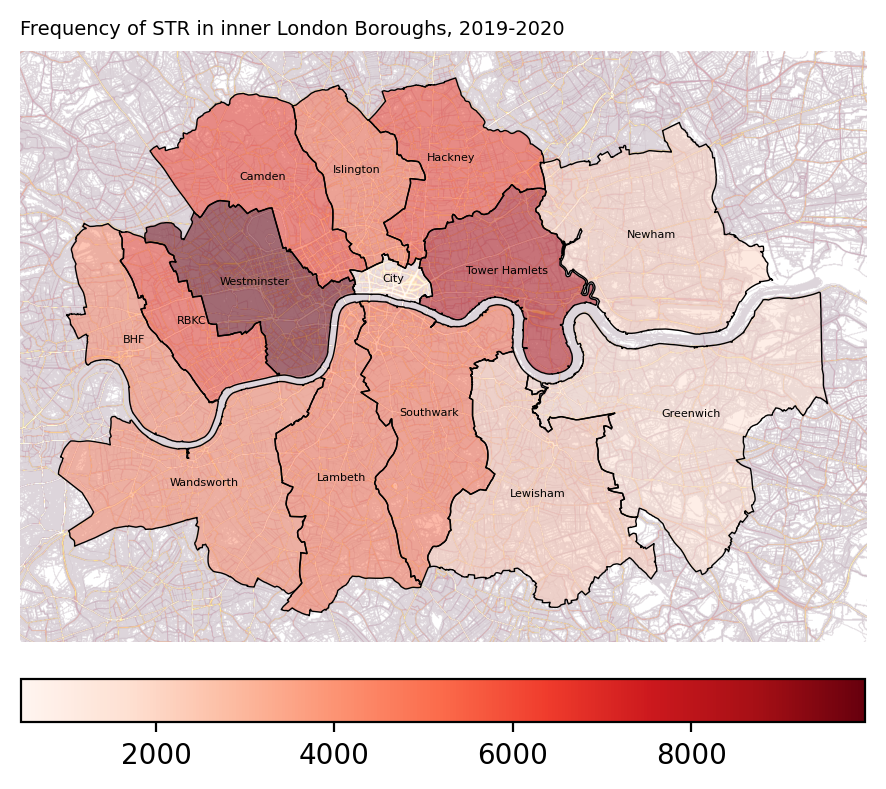

In [ ]:
# BUILD MAP FOR STR BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT
# plot airbnb frequency
a_freq = filter_data.plot(df_boroughs["count_list"], alpha=0.50, cmap="Reds", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=a_freq, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(a_freq, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
a_freq.set_axis_off()
a_freq.margins(0)
a_freq.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
mtitle = "Frequency of STR in inner London Boroughs, 2019-2020"
a_freq.set_title(mtitle, fontsize=7, loc='left')

plt.show()

<Figure size 2000x2000 with 0 Axes>

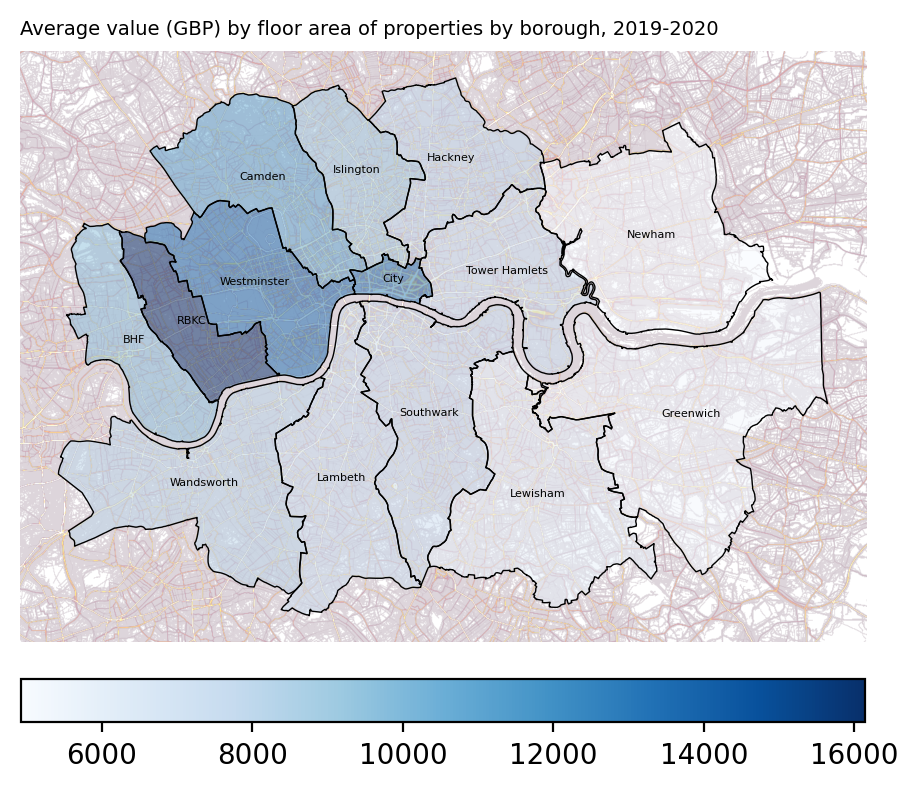

In [ ]:
# BUILD MAP FOR AVG PROP VALUE BY FLOOR AREA BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT

# plot price per square metre average by borough
p_sm = filter_data.plot(df_boroughs["price_sq_m"], alpha=0.50, cmap="Blues", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=p_sm, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(p_sm, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
p_sm.set_axis_off()
p_sm.margins(0)
p_sm.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
mtitle = "Average value (GBP) by floor area of properties by borough, 2019-2020"
p_sm.set_title(mtitle, fontsize=7, loc='left')

plt.show()

<Figure size 2000x2000 with 0 Axes>

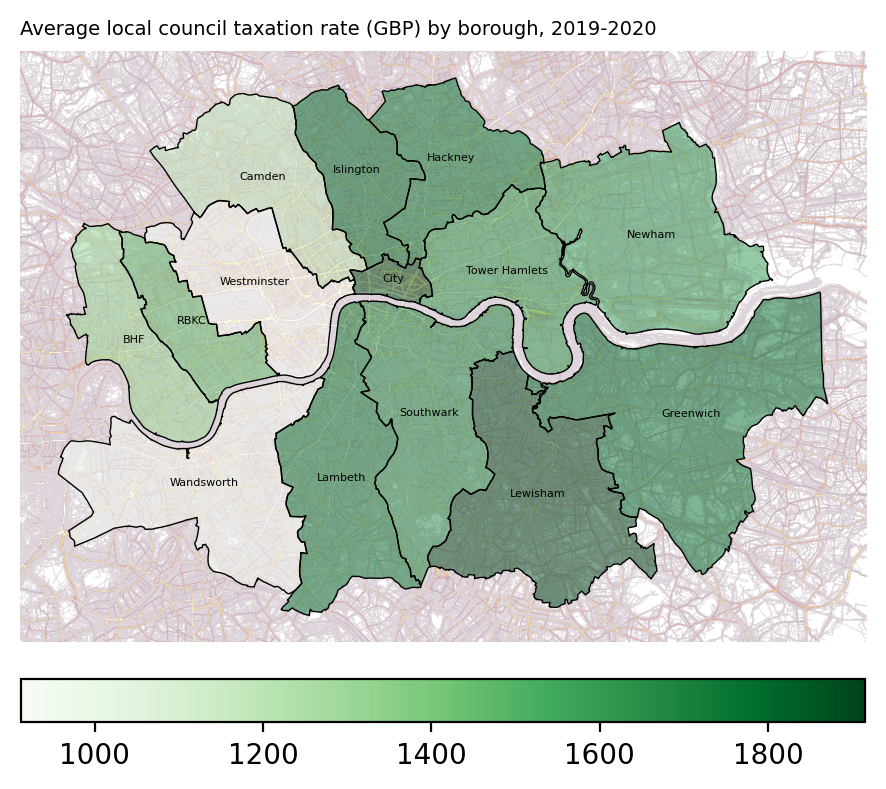

In [ ]:
# BUILD MAP FOR AVG TAXATION RATE BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT

# plot average tax rate by borough
p_sm = filter_data.plot(df_boroughs["avg_tax"], alpha=0.50, cmap="Greens", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=p_sm, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(p_sm, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
p_sm.set_axis_off()
p_sm.margins(0)
p_sm.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
mtitle = "Average local council taxation rate (GBP) by borough, 2019-2020"
p_sm.set_title(mtitle, fontsize=7, loc='left')

plt.show()

Text(0.0, 1.0, 'Average level of deprivation (income) by borough, English Indices of Deprivation 2019')

<Figure size 2000x2000 with 0 Axes>

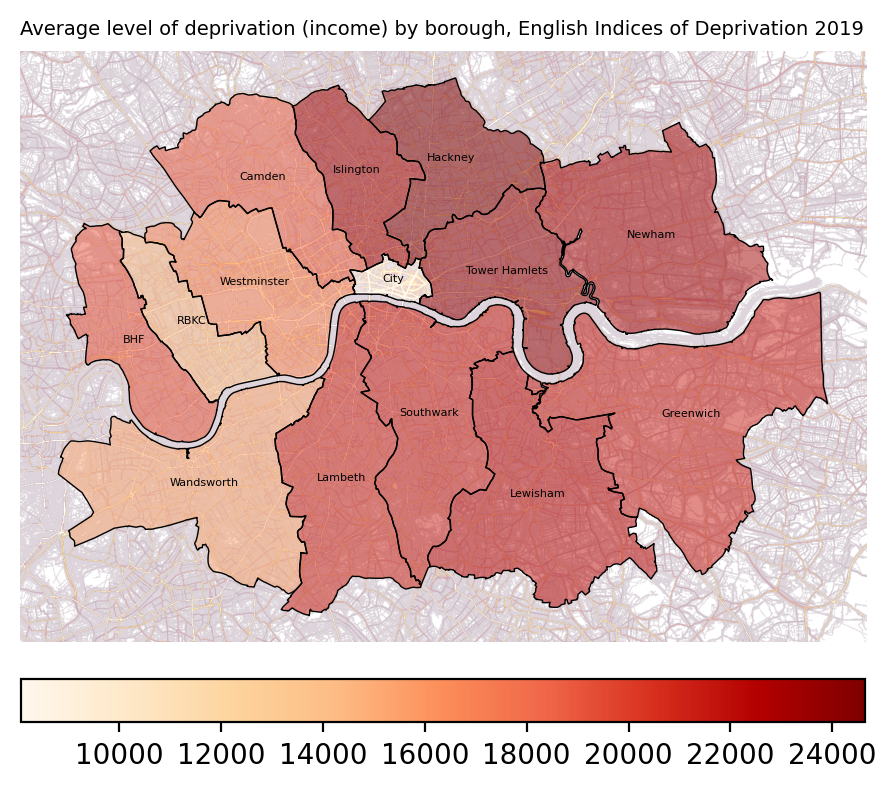

In [ ]:
# BUILD MAP FOR AVG LEVEL OF DEPRIVATION (INCOME) BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT

# plot average tax rate by borough
p_sm = filter_data.plot(df_boroughs["income-avgrank"], alpha=0.50, cmap="OrRd", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=p_sm, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(p_sm, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
p_sm.set_axis_off()
p_sm.margins(0)
p_sm.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
# Uniformly deprived scores more highly, polarization scores lower
mtitle = "Average level of deprivation (income) by borough, English Indices of Deprivation 2019"
p_sm.set_title(mtitle, fontsize=7, loc='left')


Text(0.0, 1.0, 'Average level of deprivation (employment) by borough, English Indices of Deprivation 2019')

<Figure size 2000x2000 with 0 Axes>

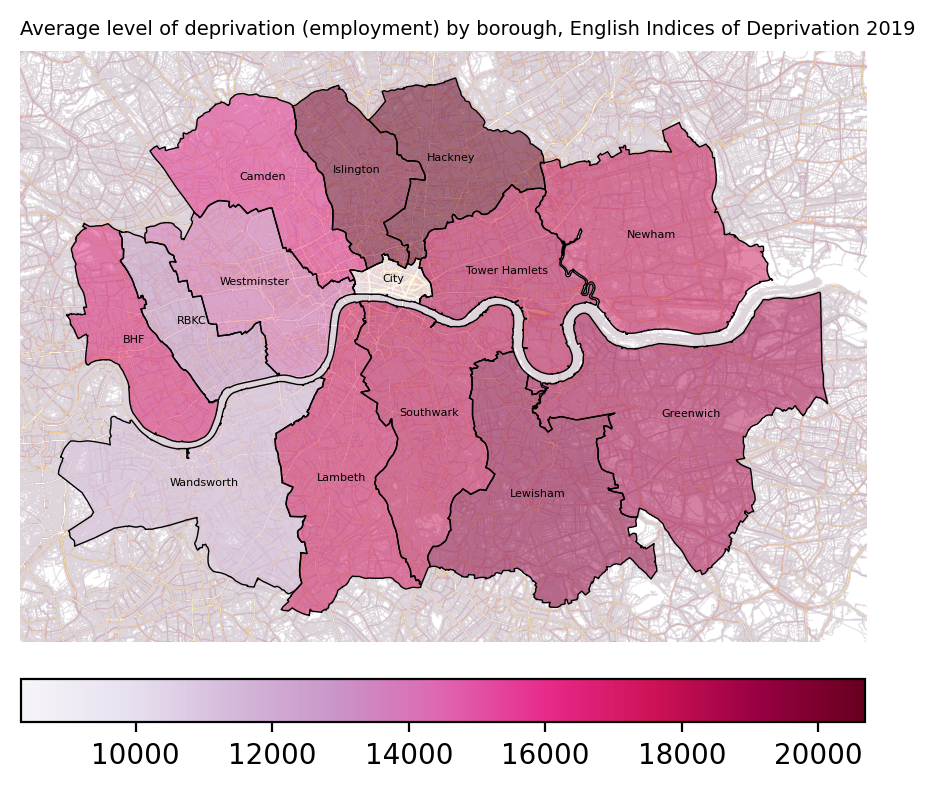

In [ ]:
# BUILD MAP FOR AVG LEVEL OF DEPRIVATION (EMPLOYMENT) BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT

# plot average tax rate by borough
p_sm = filter_data.plot(df_boroughs["employ-avgrank"], alpha=0.50, cmap="PuRd", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=p_sm, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(p_sm, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
p_sm.set_axis_off()
p_sm.margins(0)
p_sm.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
# Uniformly deprived scores more highly, polarization scores lower
mtitle = "Average level of deprivation (employment) by borough, English Indices of Deprivation 2019"
p_sm.set_title(mtitle, fontsize=7, loc='left')

Text(0.0, 1.0, 'Average level of deprivation (crime) by borough, English Indices of Deprivation 2019')

<Figure size 2000x2000 with 0 Axes>

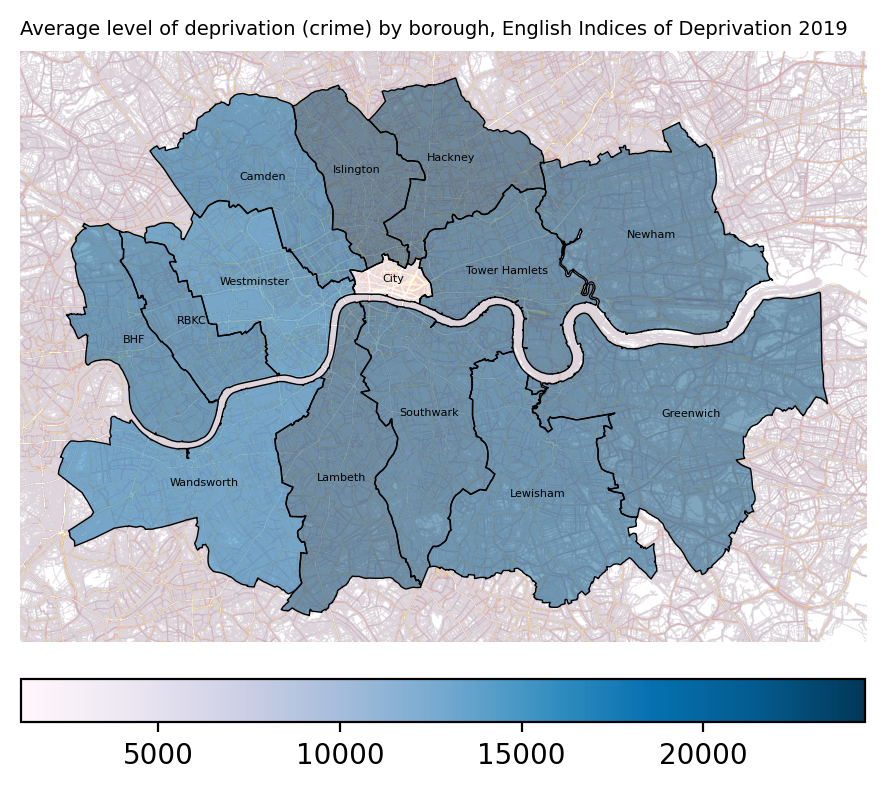

In [ ]:
# BUILD MAP FOR AVG LEVEL OF DEPRIVATION (CRIME) BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT

# plot average tax rate by borough
p_sm = filter_data.plot(df_boroughs["crime-avgrank"], alpha=0.50, cmap="PuBu", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=p_sm, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(p_sm, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
p_sm.set_axis_off()
p_sm.margins(0)
p_sm.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
# Uniformly deprived scores more highly, polarization scores lower
mtitle = "Average level of deprivation (crime) by borough, English Indices of Deprivation 2019"
p_sm.set_title(mtitle, fontsize=7, loc='left')

Text(0.0, 1.0, 'Average level of deprivation (health) by borough, English Indices of Deprivation 2019')

<Figure size 2000x2000 with 0 Axes>

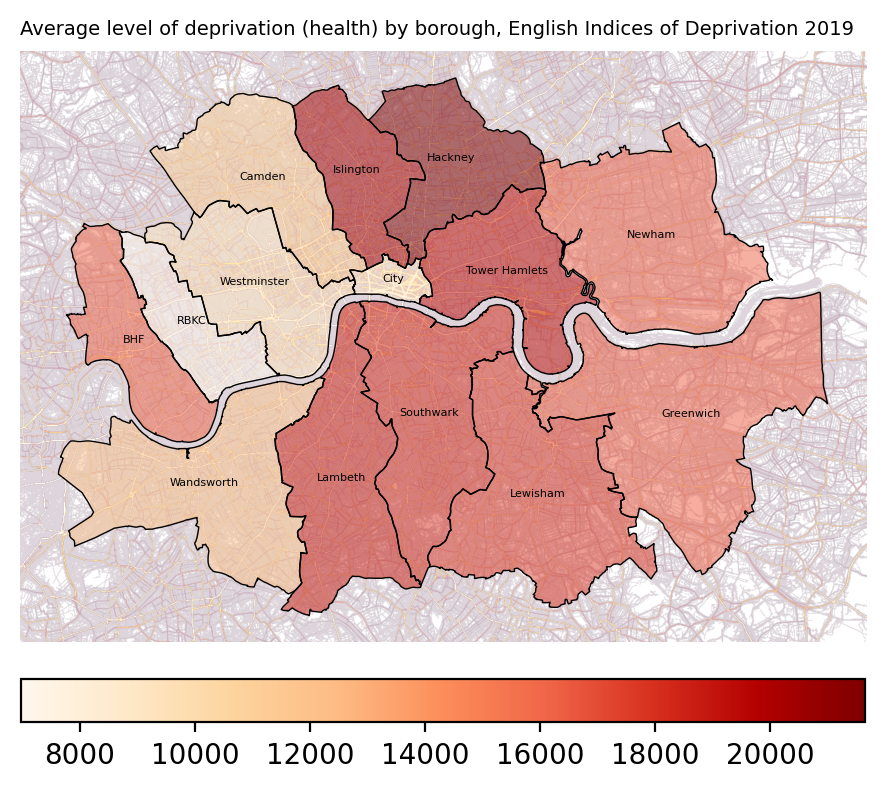

In [ ]:
# BUILD MAP FOR AVG LEVEL OF DEPRIVATION (HEALTH) BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT

# plot average tax rate by borough
p_sm = filter_data.plot(df_boroughs["health-avgrank"], alpha=0.50, cmap="OrRd", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=p_sm, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(p_sm, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
p_sm.set_axis_off()
p_sm.margins(0)
p_sm.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
# Uniformly deprived scores more highly, polarization scores lower
mtitle = "Average level of deprivation (health) by borough, English Indices of Deprivation 2019"
p_sm.set_title(mtitle, fontsize=7, loc='left')

Text(0.0, 1.0, 'Average level of deprivation (housing) by borough, English Indices of Deprivation 2019')

<Figure size 2000x2000 with 0 Axes>

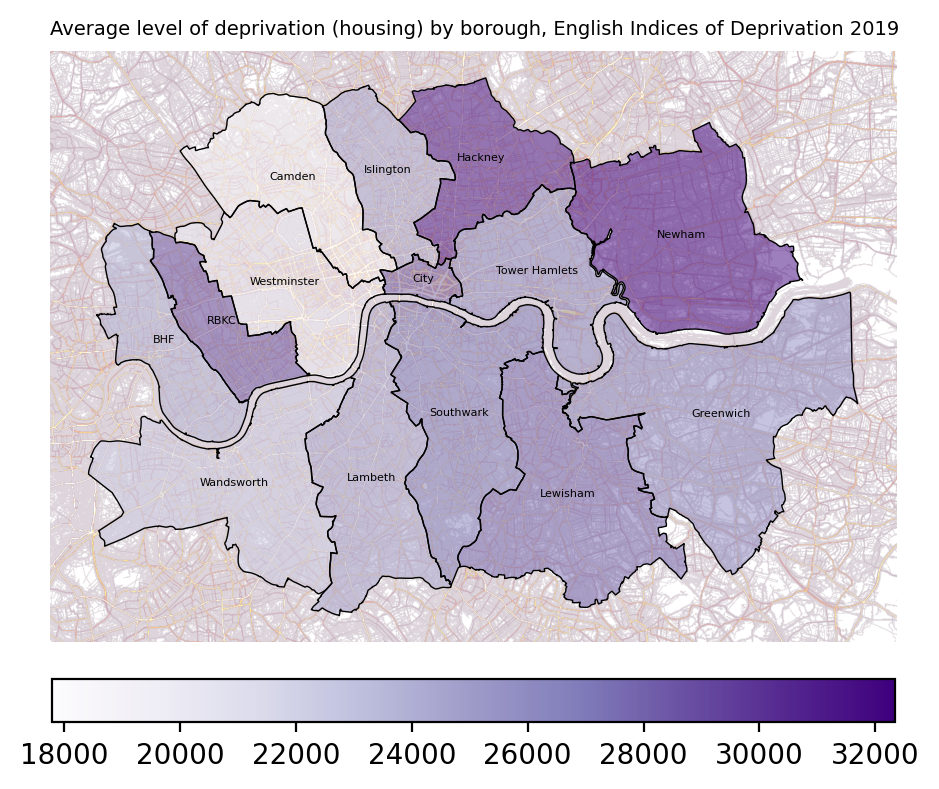

In [ ]:
# BUILD MAP FOR AVG LEVEL OF DEPRIVATION (HOUSING) BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT

# plot average tax rate by borough
p_sm = filter_data.plot(df_boroughs["housing-avgrank"], alpha=0.50, cmap="Purples", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=p_sm, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(p_sm, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
p_sm.set_axis_off()
p_sm.margins(0)
p_sm.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
# Uniformly deprived scores more highly, polarization scores lower
mtitle = "Average level of deprivation (housing) by borough, English Indices of Deprivation 2019"
p_sm.set_title(mtitle, fontsize=7, loc='left')

Text(0.0, 1.0, 'Average level of deprivation (environment) by borough, English Indices of Deprivation 2019')

<Figure size 2000x2000 with 0 Axes>

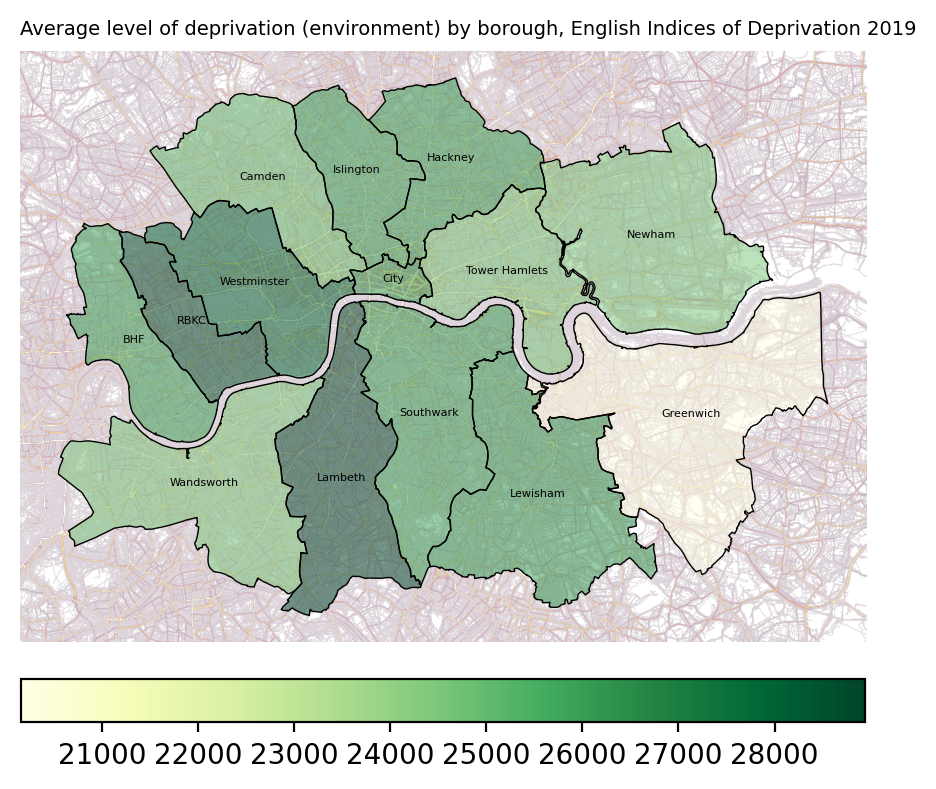

In [ ]:
# BUILD MAP FOR AVG LEVEL OF DEPRIVATION (ENVIRONMENT) BY BOROUGH
# set figure dimensions
plt.figure(figsize=(10, 10))
plt.rcParams['figure.dpi'] = 200
plt.tight_layout()

# LAYER MANAGEMENT

# plot average tax rate by borough
p_sm = filter_data.plot(df_boroughs["env-avgrank"], alpha=0.50, cmap="YlGn", legend=True, legend_kwds={'shrink': 0.85, 'orientation': 'horizontal', 'pad': 0.05})
# plot boundary lines for boroughs
boundary = filter_data['geometry'].boundary.plot(ax=p_sm, edgecolor="k", linewidth=0.5)
# add underlying basemap via contextily
cx.add_basemap(p_sm, alpha=0.5, attribution=False, source=cx.providers.Strava.Ride)

# annotate map with borough display names
filter_data.apply(lambda x: boundary.annotate(text=x['D_NAME'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=4), axis=1);

# set axis, figure and show
p_sm.set_axis_off()
p_sm.margins(0)
p_sm.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False, labelsize='small')
# Uniformly deprived scores more highly, polarization scores lower
mtitle = "Average level of deprivation (environment) by borough, English Indices of Deprivation 2019"
p_sm.set_title(mtitle, fontsize=7, loc='left')